<a href="https://colab.research.google.com/github/AdamPrzychodniPrivate/ml-drought-forecasting/blob/main/ml-modeling-pipeline/notebooks/Real_data_STGNN_Prototype_for_Drought_Forecasting_in_East_Africa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# STGNN Prototype for Drought Forecasting in East Africa



Due to a PyTorch version change in the Colab environment to 2.4.0+cu121, we need to first uninstall the current version and then install torch 2.3.1+cu121, which is required for our other libraries. Unfortunately, this process takes about 3 minutes to complete :(


In [1]:
# import os
# # Uninstall the current PyTorch version
# os.system(f"pip uninstall -y torch torchvision torchaudio")

# # Install the desired PyTorch version
# os.system(f"pip install torch==2.3.1 torchvision==0.18.1 torchaudio==2.3.1 --index-url https://download.pytorch.org/whl/cu121")

In [2]:
# import torch
# os.environ['TORCH'] = torch.__version__
# print(torch.__version__)

In [3]:
# os.system(f"pip install torch-scatter -f https://data.pyg.org/whl/torch-2.3.0+cu121.html")
# os.system(f"pip install torch-sparse -f https://data.pyg.org/whl/torch-2.3.0+cu121.html")
# os.system(f"pip install torch-geometric")
# os.system(f"pip install -q git+https://github.com/TorchSpatiotemporal/tsl.git")

# Loading and Preprocessing Data

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
import tsl
import numpy as np
import pandas as pd
import random
import torch
from pathlib import Path
from tsl.ops.similarities import gaussian_kernel
from scipy.spatial.distance import pdist, squareform
from tsl.ops.similarities import geographical_distance
from typing import Optional, Union, List

# Format pandas DataFrame floats to 3 decimal places.

pd.options.display.float_format = '{:.3f}'.format

# Set NumPy floats precision to 3 and limit array display.
np.set_printoptions(edgeitems=3, precision=3)

# Set PyTorch floats precision to 3 and limit tensor display.
torch.set_printoptions(edgeitems=2, precision=3)

In [6]:
print(f"tsl version  : {tsl.__version__}")
print(f"torch version: {torch.__version__}")

tsl version  : 0.9.5
torch version: 2.4.1+cu121


## Load raw data

In [7]:
# df = pd.read_parquet("/content/drive/MyDrive/data/preprocessed_data.parquet")

In [8]:
df = pd.read_parquet("/teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/03_primary/preprocessed_data.parquet")

In [9]:
df['time'] = pd.to_datetime(df['time'])

In [10]:
df

,lat,lon,time,PRECTOTCORR,T2M,T2M_MAX,T2M_MIN,TS,PS,WS2M,...,eddi_09mn,eddi_12mn,Nino12_lag6m,Nino3_lag6m,Nino34_lag6m,Nino4_lag6m,WTIO_lag3m,SETIO_lag3m,DMI_lag3m,SWIO_lag3m
0,-4.500,36.875,1981-09-06,0.000,293.579,301.492,287.537,296.364,88202.205,4.453,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
1,-4.500,37.500,1981-09-06,0.000,294.169,301.609,288.626,296.686,90877.446,3.647,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
2,-4.500,38.125,1981-09-06,0.000,293.935,301.243,288.412,295.907,92061.670,2.674,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
3,-4.500,38.750,1981-09-06,0.000,295.993,302.423,291.340,297.544,96825.875,3.242,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
4,-4.500,39.375,1981-09-06,0.000,298.104,301.304,295.663,299.335,100592.393,4.148,...,-2.158,-2.158,-0.477,-0.229,-0.219,-0.045,-0.510,-0.169,-0.341,-0.896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3650455,22.000,33.125,2024-04-28,0.000,302.766,311.246,295.191,304.777,97286.125,4.527,...,1.555,1.782,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650456,22.000,34.375,2024-04-28,0.000,304.262,312.602,296.281,307.758,95978.781,2.867,...,1.388,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650457,22.000,35.000,2024-04-28,0.000,302.746,311.352,295.352,306.961,93670.812,2.500,...,1.253,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650458,22.000,35.625,2024-04-28,0.000,301.172,310.258,294.105,305.844,93352.125,3.406,...,1.195,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230


In [11]:
df = df[df['time'] >= '2000-01-01']

In [12]:
df

,lat,lon,time,PRECTOTCORR,T2M,T2M_MAX,T2M_MIN,TS,PS,WS2M,...,eddi_09mn,eddi_12mn,Nino12_lag6m,Nino3_lag6m,Nino34_lag6m,Nino4_lag6m,WTIO_lag3m,SETIO_lag3m,DMI_lag3m,SWIO_lag3m
1567660,-11.500,35.000,2000-01-02,0.000,299.391,303.731,295.590,300.693,91915.500,2.874,...,-1.239,-1.241,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567661,-11.500,35.625,2000-01-02,0.000,298.959,305.189,293.871,299.720,93330.455,1.930,...,-1.239,-1.139,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567662,-11.500,36.250,2000-01-02,0.000,299.382,305.689,294.193,300.300,94047.920,2.209,...,-1.248,-0.979,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567663,-11.500,36.875,2000-01-02,0.000,299.875,306.134,294.580,300.862,94964.348,2.470,...,-1.122,-0.889,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
1567664,-11.500,37.500,2000-01-02,0.000,299.761,305.647,294.711,300.586,95922.634,2.395,...,-1.036,-0.755,-0.308,-1.668,-1.761,-1.068,-0.629,-0.330,-0.299,0.850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3650455,22.000,33.125,2024-04-28,0.000,302.766,311.246,295.191,304.777,97286.125,4.527,...,1.555,1.782,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650456,22.000,34.375,2024-04-28,0.000,304.262,312.602,296.281,307.758,95978.781,2.867,...,1.388,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650457,22.000,35.000,2024-04-28,0.000,302.746,311.352,295.352,306.961,93670.812,2.500,...,1.253,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230
3650458,22.000,35.625,2024-04-28,0.000,301.172,310.258,294.105,305.844,93352.125,3.406,...,1.195,1.555,0.824,0.503,0.728,0.946,0.920,0.521,0.398,0.230


In [13]:
df['eddi_06mn'].describe()

count   2082800.000
mean          0.246
std           0.985
min          -2.168
25%          -0.417
50%           0.302
75%           0.950
max           2.173
Name: eddi_06mn, dtype: float64

## Building class based DatetimeDataset from tsl library

What we will need to create our DatetimeDataset class?

We need:
- data - DataFrame containing the data related to the main signals. The index is considered as the temporal dimension. The columns are identified as:

  - (nodes, channels): there are two levels (columns is a MultiIndex). We assume nodes are at first level, channels at second.

- metadata
- distance matrix

### Data

In [24]:
import pandas as pd
import os

def process_dataframe(df: pd.DataFrame, save_directory: str = None) -> pd.DataFrame:
    """
    Process the input DataFrame to create unique node IDs based on latitude and longitude,
    reshape and pivot the data, and save the DataFrame in a specified directory.

    Parameters:
    df (pd.DataFrame): The input DataFrame with columns 'lat', 'lon', 'time', 'variable_1', 'variable_2', ..., 'variable_n'
    save_directory (str, optional): The directory where the output file will be saved. If None, the file will be saved
                                    in the current working directory.

    Returns:
    pd.DataFrame: The processed DataFrame with MultiIndex columns (node_id, channels)
                  and the index set as the temporal dimension.
    """

    # Create a unique node ID for each unique lat-lon combination
    unique_lat_lon = df[['lat', 'lon']].drop_duplicates().reset_index(drop=True)
    unique_lat_lon['node_id'] = unique_lat_lon.index

    # Merge this mapping back to the original DataFrame
    df = df.merge(unique_lat_lon, on=['lat', 'lon'], how='left')
    df = df.drop(['lat', 'lon'], axis=1)

    # Dynamically determine the value variables
    id_vars = ['time', 'node_id']
    value_vars = [col for col in df.columns if col not in id_vars]

    # Reshape the DataFrame using pd.melt
    df_melted = pd.melt(df, id_vars=id_vars, value_vars=value_vars)
    df_melted.rename(columns={'variable': 'channels'}, inplace=True)

    # Pivot the table and sort MultiIndex
    df_pivoted = df_melted.pivot_table(index='time', columns=['node_id', 'channels'], values='value')
    df_pivoted.sort_index(axis=0, inplace=True)
    df_pivoted.sort_index(axis=1, inplace=True)

    # Handle save directory and save as .parquet file
    if save_directory:
        os.makedirs(save_directory, exist_ok=True)  # Create directory if it doesn't exist
        file_path = os.path.join(save_directory, "data.parquet")
    else:
        file_path = "data.parquet"  # Save in the current working directory

    df_pivoted.to_parquet(file_path)
    print(f"File saved at: {file_path}")

    return df_pivoted

# Example usage:
# data = process_dataframe(df)
data = process_dataframe(df, save_directory='/teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/05_model_input')

File saved at: /teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/05_model_input/data.parquet


In [15]:
# data

### Metadata

In [25]:
import pandas as pd
import os

def generate_and_save_metadata(df: pd.DataFrame, lat_col: str = 'lat', lon_col: str = 'lon', save_directory: str = None) -> pd.DataFrame:
    """
    Generates metadata from a given DataFrame by identifying unique latitude and longitude
    combinations and assigning a unique node ID to each combination. The metadata is then
    saved to a specified Parquet file.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - lat_col (str): The name of the column containing latitude data.
    - lon_col (str): The name of the column containing longitude data.
    - save_directory (str, optional): The directory where the metadata file will be saved. If None, 
                                      the file will be saved in the current working directory.

    Returns:
    - pd.DataFrame: A DataFrame containing the metadata with latitude, longitude, and 'node_id' as columns.
    """
    # Ensure the DataFrame contains necessary columns
    if lat_col not in df.columns or lon_col not in df.columns:
        raise ValueError(f"DataFrame must contain '{lat_col}' and '{lon_col}' columns.")

    # Create a unique node ID for each unique latitude-longitude combination
    unique_lat_lon = df[[lat_col, lon_col]].drop_duplicates().reset_index(drop=True)
    unique_lat_lon['node_id'] = unique_lat_lon.index

    # Create the metadata DataFrame
    metadata = unique_lat_lon.set_index('node_id')

    # Handle save directory and save metadata to Parquet file
    if save_directory:
        os.makedirs(save_directory, exist_ok=True)  # Create directory if it doesn't exist
        file_path = os.path.join(save_directory, "metadata.parquet")
    else:
        file_path = "metadata.parquet"  # Save in the current working directory

    metadata.to_parquet(file_path)
    print(f"Metadata file saved at: {file_path}")

    return metadata

# Example usage
# metadata = generate_and_save_metadata(df, lat_col='lat', lon_col='lon')
metadata = generate_and_save_metadata(df, lat_col='lat', lon_col='lon', save_directory='/teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/05_model_input')


Metadata file saved at: /teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/05_model_input/metadata.parquet


In [18]:
# metadata

### Distance matrix

In [26]:
import numpy as np
import os

def calculate_and_save_distance(metadata: pd.DataFrame, save_directory: str = None) -> np.ndarray:
    """
    Calculate the geographical distance matrix from latitude and longitude in the metadata DataFrame,
    save it to a .npy file, and return the numpy array of distances.

    Args:
    metadata (pd.DataFrame): A DataFrame containing at least two columns ['lat', 'lon'] for latitude and longitude.
    save_directory (str, optional): The directory where the distance matrix file will be saved. If None, the file will
                                    be saved in the current working directory.

    Returns:
    np.ndarray: A 2D numpy array containing the calculated distances between each pair of points.
    """
    # Extract latitude and longitude columns from metadata.
    coords = metadata.loc[:, ['lat', 'lon']]

    # Calculate geographical distances with coordinates converted to radians.
    dist = geographical_distance(coords, to_rad=True).values

    # Handle save directory and save as .npy file
    if save_directory:
        os.makedirs(save_directory, exist_ok=True)  # Create directory if it doesn't exist
        file_path = os.path.join(save_directory, "distance_matrix.npy")
    else:
        file_path = "distance_matrix.npy"  # Save in the current working directory

    np.save(file_path, dist)
    print(f"Distance matrix file saved at: {file_path}")

    return dist

# Example usage:
# distance_matrix = calculate_and_save_distance(metadata)
distance_matrix = calculate_and_save_distance(metadata, save_directory='/teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/05_model_input')


Distance matrix file saved at: /teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/05_model_input/distance_matrix.npy


In [27]:
# distance_matrix

## Vizulize data

Below we can see this graph on a map

In [28]:
# add viz

## Build class DroughtDataset based on DatetimeDataset from tsl

## Class DatetimeDataset

https://torch-spatiotemporal.readthedocs.io/en/dev/modules/datasets_prototypes.html#tsl.datasets.prototypes.DatetimeDataset

In [29]:
from typing import Optional

from tsl.datasets.prototypes import DatetimeDataset

class DroughtDataset(DatetimeDataset):
    """
    A dataset class for drought-related data, inheriting from DatetimeDataset.

    This class handles loading and preprocessing of drought data, including
    target variables and all available covariates.

    Attributes:
        similarity_options (set): Available options for similarity calculations.
        root (str): Root directory for data files.
    """

    similarity_options = {'distance', 'correlation'}

    def __init__(self,
                 root: str = None,
                 freq: Optional[str] = None,
                 target_node_feature: str = "eddi"
                 ):
        """
        Initialize the DroughtDataset.

        Args:
            root (str, optional): Root directory for data files.
            freq (str, optional): Frequency for time series data.
            target_node_feature (str, optional): The node feature to use as the target. Defaults to "eddi".
        """
        self.root = root
        self.target_node_feature = target_node_feature

        # Load data
        df, metadata, dist = self.load()

        # Set target
        nodes = metadata.index
        target_columns = pd.MultiIndex.from_product([nodes, [self.target_node_feature]])
        target = df.loc[:, target_columns]

        # Identify all available features (excluding the target feature)
        all_features = [col for col in df.columns.get_level_values(1).unique() if col != self.target_node_feature]

        # Set covariates
        covariate_columns = pd.MultiIndex.from_product([nodes, all_features])
        u = df.loc[:, covariate_columns]

        covariates = {
            'u': (u, 't n f'),  # 'u' for exogenous variables / node features
            'metadata': (metadata, 'n f'),
            'distances': (dist, 'n n')
        }

        super().__init__(target=target,
                         covariates=covariates,
                         freq=freq,
                         similarity_score='distance',
                         temporal_aggregation='mean',
                         spatial_aggregation='mean',
                         name='DroughtDataset')

    def load(self):
        """
        Load data from files.

        Returns:
            tuple: Containing dataframe, metadata, and distance matrix.
        """
        data_path = f"{self.root}data.parquet"
        metadata_path = f"{self.root}metadata.parquet"
        dist_path = f"{self.root}distance_matrix.npy"

        # Load main data
        df = pd.read_parquet(data_path)

        # Load metadata
        metadata = pd.read_parquet(metadata_path)

        # Load distance matrix
        dist = np.load(dist_path)

        return df, metadata, dist

    def compute_similarity(self, method: str, **kwargs):
        """
        Compute similarity matrix based on the specified method.

        Args:
            method (str): The similarity computation method ('distance' or 'correlation').
            **kwargs: Additional keyword arguments for similarity computation.

        Returns:
            numpy.ndarray: Computed similarity matrix.

        Raises:
            ValueError: If an unknown similarity method is provided.
        """
        if method == "distance":
            # Calculate a Gaussian kernel similarity from the distance matrix, using a default or provided 'theta'
            theta = kwargs.get('theta', np.std(self.distances))
            return self.gaussian_kernel(self.distances, theta=theta)
        elif method == "correlation":
            # Calculate the pairwise correlation of the target variable, normalize it to [0, 1]
            corr = self.target.corr().values
            return (corr + 1) / 2  # Normalize to [0, 1]
        else:
            raise ValueError(f"Unknown similarity method: {method}")

    @staticmethod
    def gaussian_kernel(distances, theta):
        """
        Compute Gaussian kernel similarity from distances.

        Args:
            distances (numpy.ndarray): Distance matrix.
            theta (float): Kernel bandwidth parameter.

        Returns:
            numpy.ndarray: Gaussian kernel similarity matrix.
        """
        return np.exp(-(distances ** 2) / (2 * (theta ** 2)))

In [31]:
# dataset = DroughtDataset(root='/content/drive/MyDrive/data/', target_node_feature="eddi_06mn")
dataset = DroughtDataset(root='/teamspace/studios/this_studio/ml-drought-forecasting/ml-modeling-pipeline/data/05_model_input/', target_node_feature="eddi_06mn")

This is our target variable "eddi_06mn"

In [32]:
dataset.target

nodes,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
channels,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,...,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn
time,,,,,,,,,,,,,,,,,,,,,
2000-01-02,-1.205,-1.093,-0.921,-0.841,-0.853,-1.189,-0.980,-1.013,-0.914,-0.708,...,-0.041,0.042,0.066,0.116,0.017,-0.041,-0.057,-0.057,0.100,0.452
2000-01-09,-1.097,-0.940,-0.878,-0.775,-0.598,-1.078,-0.953,-0.918,-0.660,-0.538,...,0.091,0.116,0.120,0.158,0.108,0.009,0.116,0.183,0.217,0.552
2000-01-16,-0.940,-0.773,-0.740,-0.539,-0.338,-0.855,-0.866,-0.706,-0.391,-0.293,...,0.302,0.268,0.294,0.337,0.303,0.200,0.200,0.269,0.420,0.687
2000-01-23,-0.833,-0.688,-0.555,-0.287,-0.182,-0.740,-0.752,-0.476,-0.225,-0.199,...,0.504,0.449,0.423,0.426,0.463,0.464,0.495,0.643,0.778,0.876
2000-01-30,-0.796,-0.687,-0.462,-0.165,-0.174,-0.708,-0.666,-0.416,-0.174,-0.140,...,0.548,0.531,0.462,0.426,0.566,0.586,0.752,0.831,0.854,0.971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-31,0.726,0.634,0.586,0.411,0.359,0.385,0.325,0.212,0.142,0.028,...,0.825,0.647,0.440,0.308,0.300,0.402,0.387,0.386,0.326,-0.013
2024-04-07,0.657,0.512,0.482,0.394,0.283,0.342,0.249,0.131,0.012,-0.012,...,0.597,0.450,0.189,0.045,0.037,0.111,0.209,0.176,0.118,-0.249


The covariates include:

- "u", node features
- metadata (latitude and longitude for each node)
- distance matrix between nodes

all stored in a dictionary structure.

In [33]:
dataset.covariates

{'u': node_id     0                                                                 \
 channels   DISPH DMI_lag3m Nino12_lag6m Nino34_lag6m Nino3_lag6m Nino4_lag6m   
 time                                                                           
 2000-01-02 1.695    -0.299       -0.308       -1.761      -1.668      -1.068   
 2000-01-09 1.743    -0.017       -0.475       -1.864      -1.942      -1.109   
 2000-01-16 1.775    -0.273       -0.566       -1.876      -1.718      -1.246   
 2000-01-23 1.797     0.439       -0.787       -1.775      -1.737      -1.076   
 2000-01-30 1.815     0.167       -0.720       -1.902      -1.812      -1.240   
 ...          ...       ...          ...          ...         ...         ...   
 2024-03-31 1.844     0.556        0.101        1.149       1.182       0.885   
 2024-04-07 1.844     0.341        0.132        1.366       1.228       0.995   
 2024-04-14 1.844     0.051        0.341        0.888       0.721       0.718   
 2024-04-21 1.844     0

The 'u' in covariates is containing exogenous variables (node features), with a multi-level column index representing node_id and channels (node features).

In [34]:
dataset.covariates['u']

node_id     0                                                                 \
channels   DISPH DMI_lag3m Nino12_lag6m Nino34_lag6m Nino3_lag6m Nino4_lag6m   
time                                                                           
2000-01-02 1.695    -0.299       -0.308       -1.761      -1.668      -1.068   
2000-01-09 1.743    -0.017       -0.475       -1.864      -1.942      -1.109   
2000-01-16 1.775    -0.273       -0.566       -1.876      -1.718      -1.246   
2000-01-23 1.797     0.439       -0.787       -1.775      -1.737      -1.076   
2000-01-30 1.815     0.167       -0.720       -1.902      -1.812      -1.240   
...          ...       ...          ...          ...         ...         ...   
2024-03-31 1.844     0.556        0.101        1.149       1.182       0.885   
2024-04-07 1.844     0.341        0.132        1.366       1.228       0.995   
2024-04-14 1.844     0.051        0.341        0.888       0.721       0.718   
2024-04-21 1.844     0.259       -0.203        0.877       0.756       0.968   
2024-04-28 1.844     0.350        0.726        0.955       0.853       1.025   

node_id                                       ...  1639                   \
channels   PRECTOTCORR        PS QV10M  QV2M  ...  WS2M WS50M WTIO_lag3m   
time                                          ...                          
2000-01-02       0.000 91915.500 0.014 0.015  ... 3.214 5.004     -0.371   
2000-01-09       0.000 91942.625 0.015 0.015  ... 3.371 5.866     -0.186   
2000-01-16       0.000 92221.695 0.014 0.015  ... 2.454 4.296      0.107   
2000-01-23       0.000 92152.609 0.014 0.015  ... 3.185 5.366     -0.155   
2000-01-30       0.000 92194.328 0.015 0.015  ... 3.073 5.213     -0.081   
...                ...       ...   ...   ...  ...   ...   ...        ...   
2024-03-31       0.000 92466.930 0.016 0.016  ... 2.295 3.355      0.846   
2024-04-07       0.000 92364.055 0.016 0.017  ... 3.125 4.881      0.862   
2024-04-14       0.000 92683.859 0.015 0.015  ... 2.710 4.033      0.994   
2024-04-21       0.000 92516.438 0.014 0.015  ... 3.010 4.703      1.042   
2024-04-28       0.000 92745.438 0.012 0.012  ... 3.281 4.465      0.920   

node_id                                                                 \
channels   eddi_01mn eddi_01wk eddi_02mn eddi_02wk eddi_03mn eddi_09mn   
time                                                                     
2000-01-02     0.292     0.621     0.803     0.817     1.239     0.854   
2000-01-09     0.778     0.588     0.758     0.768     0.848     0.750   
2000-01-16     0.871     0.265     0.642     0.468     0.675     0.720   
2000-01-23     1.241     1.621     0.749     1.317     0.807     0.878   
2000-01-30     1.194     0.402     0.670     1.505     1.095     0.982   
...              ...       ...       ...       ...       ...       ...   
2024-03-31    -0.382    -1.176     0.094    -0.959     0.301     0.735   
2024-04-07    -0.650     0.566     0.029    -0.565     0.324     0.654   
2024-04-14    -0.161     0.873     0.212     0.851     0.474     0.537   
2024-04-21     0.501     1.174     0.554     1.314     0.562     0.613   
2024-04-28     0.292    -0.152     0.129     0.317     0.333     0.563   

node_id               
channels   eddi_12mn  
time                  
2000-01-02     1.015  
2000-01-09     1.043  
2000-01-16     1.028  
2000-01-23     1.072  
2000-01-30     1.101  
...              ...  
2024-03-31     0.652  
2024-04-07     0.773  
2024-04-14     0.859  
2024-04-21     0.959  
2024-04-28     0.881  

[1270 rows x 73800 columns]

In [35]:
dataset.covariates['metadata']

,lat,lon
nodes,,
0,-11.500,35.000
1,-11.500,35.625
2,-11.500,36.250
3,-11.500,36.875
4,-11.500,37.500
...,...,...
1635,22.000,33.125
1636,22.000,34.375
1637,22.000,35.000


In [36]:
dataset.covariates['distances']

array([[   0.   ,   68.102,  136.203, ..., 3725.035, 3725.659, 3727.53 ],
       [  68.102,    0.   ,   68.102, ..., 3725.659, 3725.035, 3725.659],
       [ 136.203,   68.102,    0.   , ..., 3727.53 , 3725.659, 3725.035],
       ...,
       [3725.035, 3725.659, 3727.53 , ...,    0.   ,   64.436,  128.872],
       [3725.659, 3725.035, 3725.659, ...,   64.436,    0.   ,   64.436],
       [3727.53 , 3725.659, 3725.035, ...,  128.872,   64.436,    0.   ]],
      dtype=float32)

In [37]:
print(f"Sampling period: {dataset.freq}")

Sampling period: <Week: weekday=6>


In [38]:
print(f"Has missing values: {dataset.has_mask}")

Has missing values: False


In [39]:
print(f"Has covariates variables: {dataset.has_covariates}")


Has covariates variables: True


In [40]:
print(f"Covariates: {', '.join(dataset.covariates.keys())}")

Covariates: u, metadata, distances


In [41]:
def print_matrix(matrix):
    return pd.DataFrame(matrix)

In [42]:
print_matrix(dataset.covariates['distances'])

,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
0,0.000,68.102,136.203,204.305,272.406,55.598,87.961,147.224,211.907,278.255,...,3764.757,3755.485,3747.431,3740.602,3735.005,3730.647,3725.659,3725.035,3725.659,3727.530
1,68.102,0.000,68.102,136.203,204.305,87.961,55.598,87.961,147.224,211.907,...,3775.238,3764.757,3755.485,3747.431,3740.602,3735.005,3727.530,3725.659,3725.035,3725.659
2,136.203,68.102,0.000,68.102,136.203,147.224,87.961,55.598,87.961,147.224,...,3786.917,3775.238,3764.757,3755.485,3747.431,3740.602,3730.647,3727.530,3725.659,3725.035
3,204.305,136.203,68.102,0.000,68.102,211.907,147.224,87.961,55.598,87.961,...,3799.784,3786.917,3775.238,3764.757,3755.485,3747.431,3735.005,3730.647,3727.530,3725.659
4,272.406,204.305,136.203,68.102,0.000,278.255,211.907,147.224,87.961,55.598,...,3813.826,3799.784,3786.917,3775.238,3764.757,3755.485,3740.602,3735.005,3730.647,3727.530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1635,3730.647,3735.005,3740.602,3747.431,3755.485,3675.134,3679.559,3685.239,3692.170,3700.345,...,322.177,257.743,193.308,128.872,64.436,0.000,128.872,193.308,257.743,322.177
1636,3725.659,3727.530,3730.647,3735.005,3740.602,3670.071,3671.970,3675.134,3679.559,3685.239,...,451.040,386.609,322.177,257.743,193.308,128.872,0.000,64.436,128.872,193.308
1637,3725.035,3725.659,3727.530,3730.647,3735.005,3669.438,3670.071,3671.970,3675.134,3679.559,...,515.468,451.040,386.609,322.177,257.743,193.308,64.436,0.000,64.436,128.872
1638,3725.659,3725.035,3725.659,3727.530,3730.647,3670.071,3669.438,3670.071,3671.970,3675.134,...,579.895,515.468,451.040,386.609,322.177,257.743,128.872,64.436,0.000,64.436


In [43]:
dataset.dataframe()

nodes,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
channels,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,...,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn,eddi_06mn
time,,,,,,,,,,,,,,,,,,,,,
2000-01-02,-1.205,-1.093,-0.921,-0.841,-0.853,-1.189,-0.980,-1.013,-0.914,-0.708,...,-0.041,0.042,0.066,0.116,0.017,-0.041,-0.057,-0.057,0.100,0.452
2000-01-09,-1.097,-0.940,-0.878,-0.775,-0.598,-1.078,-0.953,-0.918,-0.660,-0.538,...,0.091,0.116,0.120,0.158,0.108,0.009,0.116,0.183,0.217,0.552
2000-01-16,-0.940,-0.773,-0.740,-0.539,-0.338,-0.855,-0.866,-0.706,-0.391,-0.293,...,0.302,0.268,0.294,0.337,0.303,0.200,0.200,0.269,0.420,0.687
2000-01-23,-0.833,-0.688,-0.555,-0.287,-0.182,-0.740,-0.752,-0.476,-0.225,-0.199,...,0.504,0.449,0.423,0.426,0.463,0.464,0.495,0.643,0.778,0.876
2000-01-30,-0.796,-0.687,-0.462,-0.165,-0.174,-0.708,-0.666,-0.416,-0.174,-0.140,...,0.548,0.531,0.462,0.426,0.566,0.586,0.752,0.831,0.854,0.971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-31,0.726,0.634,0.586,0.411,0.359,0.385,0.325,0.212,0.142,0.028,...,0.825,0.647,0.440,0.308,0.300,0.402,0.387,0.386,0.326,-0.013
2024-04-07,0.657,0.512,0.482,0.394,0.283,0.342,0.249,0.131,0.012,-0.012,...,0.597,0.450,0.189,0.045,0.037,0.111,0.209,0.176,0.118,-0.249


In [44]:
print(f"Default similarity: {dataset.similarity_score}")

Default similarity: distance


In [45]:
print(f"Available similarity options: {dataset.similarity_options}")

Available similarity options: {'distance', 'correlation'}


In [46]:
sim = dataset.compute_similarity("distance")  # or dataset.compute_similarity()

In [47]:
print("Similarity matrix W:")
print_matrix(sim)

Similarity matrix W:


,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
0,1.000,0.996,0.983,0.962,0.933,0.997,0.993,0.980,0.959,0.930,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,0.996,1.000,0.996,0.983,0.962,0.993,0.997,0.993,0.980,0.959,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.983,0.996,1.000,0.996,0.983,0.980,0.993,0.997,0.993,0.980,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.962,0.983,0.996,1.000,0.996,0.959,0.980,0.993,0.997,0.993,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.933,0.962,0.983,0.996,1.000,0.930,0.959,0.980,0.993,0.997,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1635,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.908,0.940,0.966,0.985,0.996,1.000,0.985,0.966,0.940,0.908
1636,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.827,0.870,0.908,0.940,0.966,0.985,1.000,0.996,0.985,0.966
1637,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.781,0.827,0.870,0.908,0.940,0.966,0.996,1.000,0.996,0.985
1638,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.731,0.781,0.827,0.870,0.908,0.940,0.985,0.996,1.000,0.996


## Building torch_dataset using SpatioTemporalDataset from tsl library

We need:
- target - which is our dataframe from dataset object - dataset.dataframe(),
- connectivity
- mask


In [48]:
connectivity = dataset.get_connectivity(threshold=0,
                                        include_self=False,
                                        normalize_axis=1,
                                        layout="edge_index")

In [49]:
edge_index, edge_weight = connectivity

In [50]:
connectivity

(array([[   0,    0,    0, ..., 1639, 1639, 1639],
        [   1,    2,    3, ..., 1636, 1637, 1638]]),
 array([0.005, 0.005, 0.005, ..., 0.003, 0.003, 0.003], dtype=float32))

In [51]:
print(f'edge_index {edge_index.shape}:\n', edge_index)
print(f'edge_weight {edge_weight.shape}:\n', edge_weight)

edge_index (2, 2687960):
 [[   0    0    0 ... 1639 1639 1639]
 [   1    2    3 ... 1636 1637 1638]]
edge_weight (2687960,):
 [0.005 0.005 0.005 ... 0.003 0.003 0.003]


In [52]:
from tsl.ops.connectivity import edge_index_to_adj

adj = edge_index_to_adj(edge_index, edge_weight)
print(f'A {adj.shape}:')
print_matrix(adj)

A (1640, 1640):


,0,1,2,3,4,5,6,7,8,9,...,1630,1631,1632,1633,1634,1635,1636,1637,1638,1639
0,0.000,0.005,0.005,0.005,0.004,0.005,0.005,0.005,0.005,0.004,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,0.005,0.000,0.005,0.005,0.005,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.005,0.005,0.000,0.005,0.005,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.005,0.005,0.005,0.000,0.005,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.005,0.005,0.005,0.005,0.000,0.005,0.005,0.005,0.005,0.005,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1635,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.003,0.003,0.003,0.003,0.003,0.000,0.003,0.003,0.003,0.003
1636,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.003,0.003,0.003,0.003,0.003,0.003,0.000,0.003,0.003,0.003
1637,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.002,0.003,0.003,0.003,0.003,0.003,0.003,0.000,0.003,0.003
1638,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.002,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.000,0.003


In [53]:
print(f'Sparse edge weights:\n', adj[edge_index[1], edge_index[0]])

Sparse edge weights:
 [0.005 0.005 0.005 ... 0.003 0.003 0.003]


In [54]:
covariates=dict(u=dataset.covariates['u'])
covariates

{'u': node_id     0                                                                 \
 channels   DISPH DMI_lag3m Nino12_lag6m Nino34_lag6m Nino3_lag6m Nino4_lag6m   
 time                                                                           
 2000-01-02 1.695    -0.299       -0.308       -1.761      -1.668      -1.068   
 2000-01-09 1.743    -0.017       -0.475       -1.864      -1.942      -1.109   
 2000-01-16 1.775    -0.273       -0.566       -1.876      -1.718      -1.246   
 2000-01-23 1.797     0.439       -0.787       -1.775      -1.737      -1.076   
 2000-01-30 1.815     0.167       -0.720       -1.902      -1.812      -1.240   
 ...          ...       ...          ...          ...         ...         ...   
 2024-03-31 1.844     0.556        0.101        1.149       1.182       0.885   
 2024-04-07 1.844     0.341        0.132        1.366       1.228       0.995   
 2024-04-14 1.844     0.051        0.341        0.888       0.721       0.718   
 2024-04-21 1.844     0

### Class SpatioTemporalDataset

https://torch-spatiotemporal.readthedocs.io/en/dev/modules/data_pytorch_datasets.html#tsl.data.SpatioTemporalDataset

In [55]:
from tsl.data import SpatioTemporalDataset

covariates=dict(u=dataset.covariates['u'])

torch_dataset = SpatioTemporalDataset(target=dataset.dataframe(),
                                      covariates=covariates,
                                      connectivity=connectivity,
                                      mask=dataset.mask,
                                      horizon=7, # Predict 7 step ahead
                                      window=30, # Use 30 timestamps to predict the next one
                                      stride=7 # Move 7 step forward each time
                                      )

In [56]:
torch_dataset

SpatioTemporalDataset(n_samples=177, n_nodes=1640, n_channels=1)

In [57]:
sample = torch_dataset[0]
sample

Data(
  input=(x=[t=30, n=1640, f=1], u=[t=30, n=1640, f=45], edge_index=[2, e=2687960], edge_weight=[e=2687960]),
  target=(y=[t=7, n=1640, f=1]),
  has_mask=False
)

In [58]:
sample.input.to_dict()

{'x': tensor([[[-1.205],
          [-1.093],
          ...,
          [ 0.100],
          [ 0.452]],
 
         [[-1.097],
          [-0.940],
          ...,
          [ 0.217],
          [ 0.552]],
 
         ...,
 
         [[-0.418],
          [-0.174],
          ...,
          [ 0.509],
          [ 0.968]],
 
         [[-0.566],
          [-0.297],
          ...,
          [ 0.657],
          [ 1.040]]]),
 'u': tensor([[[ 1.695, -0.299,  ..., -1.239, -1.241],
          [ 0.338, -0.299,  ..., -1.239, -1.139],
          ...,
          [ 0.031, -0.017,  ...,  0.337,  0.596],
          [ 0.031, -0.017,  ...,  0.854,  1.015]],
 
         [[ 1.743, -0.017,  ..., -1.239, -1.374],
          [ 0.347, -0.017,  ..., -1.172, -1.336],
          ...,
          [ 0.031, -0.273,  ...,  0.293,  0.646],
          [ 0.031, -0.273,  ...,  0.750,  1.043]],
 
         ...,
 
         [[ 1.554, -0.046,  ..., -0.319, -1.189],
          [ 0.309, -0.046,  ..., -0.024, -0.903],
          ...,
          [ 0.0

In [59]:
sample.target.to_dict()

{'y': tensor([[[-0.740],
          [-0.605],
          ...,
          [ 0.860],
          [ 1.179]],
 
         [[-0.872],
          [-0.691],
          ...,
          [ 1.023],
          [ 1.232]],
 
         ...,
 
         [[-0.797],
          [-0.666],
          ...,
          [ 1.124],
          [ 1.182]],
 
         [[-0.751],
          [-0.686],
          ...,
          [ 1.124],
          [ 1.182]]])}

In [60]:
if sample.has_mask:
    print(sample.mask)
else:
    print("Sample has no mask.")

Sample has no mask.


In [61]:
if sample.has_transform:
    print(sample.transform)
else:
    print("Sample has no transformation functions.")

Sample has no transformation functions.


In [62]:
print(sample.pattern)

{'x': 't n f', 'u': 't n f', 'edge_index': '2 e', 'edge_weight': 'e', 'y': 't n f'}


In [63]:
batch = torch_dataset[:5]
print(batch)

StaticBatch(
  input=(x=[b=5, t=30, n=1640, f=1], u=[b=5, t=30, n=1640, f=45], edge_index=[2, e=2687960], edge_weight=[e=2687960]),
  target=(y=[b=5, t=7, n=1640, f=1]),
  has_mask=False
)


## Building datamodule using SpatioTemporalDataModule from tsl library

In [ ]:
from tsl.data.preprocessing import StandardScaler

scalers = {'target': StandardScaler(axis=(0, 1))}

In [64]:
from tsl.data.datamodule import (SpatioTemporalDataModule,
                                 TemporalSplitter)
                                 
# Split data sequentially:
#   |------------ dataset -----------|
#   |--- train ---|- val -|-- test --|
splitter = TemporalSplitter(val_len=0.1, test_len=0.2)

### Class SpatioTemporalDataModule

https://torch-spatiotemporal.readthedocs.io/en/dev/modules/data_datamodule.html#tsl.data.datamodule.SpatioTemporalDataModule

In [65]:
# Create a SpatioTemporalDataModule
datamodule = SpatioTemporalDataModule(
    dataset=torch_dataset,
    scalers=scalers,
    splitter=splitter,
    batch_size=8,
    workers=2
    )

print(datamodule)

SpatioTemporalDataModule(train_len=None, val_len=None, test_len=None, scalers=[], batch_size=8)


In [66]:
datamodule.setup()
print(datamodule)

SpatioTemporalDataModule(train_len=123, val_len=9, test_len=35, scalers=[], batch_size=8)


In [67]:
datamodule.train_dataloader()

In [68]:
train_loader = datamodule.train_dataloader()
batch = next(iter(train_loader))

In [69]:
print("Batch keys:", batch.keys())

Batch keys: ['transform', 'edge_weight', 'x', 'y', 'edge_index', 'u']


In [70]:
# Extract x and u from the batch
x = batch['x'].cpu().numpy()
u = batch['u'].cpu().numpy()

x

array([[[[ 2.164e+00],
         [ 2.164e+00],
         [ 1.875e+00],
         ...,
         [ 3.464e-01],
         [ 2.171e-01],
         [ 9.149e-02]],

        [[ 2.164e+00],
         [ 2.164e+00],
         [ 2.164e+00],
         ...,
         [ 9.167e-02],
         [ 2.510e-02],
         [-1.284e-01]],

        [[ 2.164e+00],
         [ 2.164e+00],
         [ 2.164e+00],
         ...,
         [ 2.881e-04],
         [-6.572e-02],
         [-2.436e-01]],

        ...,

        [[ 9.276e-01],
         [ 9.675e-01],
         [ 1.043e+00],
         ...,
         [ 8.290e-02],
         [-2.458e-02],
         [ 5.393e-02]],

        [[ 9.276e-01],
         [ 9.276e-01],
         [ 1.059e+00],
         ...,
         [ 1.661e-01],
         [ 1.245e-01],
         [ 2.082e-01]],

        [[ 9.542e-01],
         [ 1.021e+00],
         [ 1.101e+00],
         ...,
         [ 3.368e-01],
         [ 3.023e-01],
         [ 2.766e-01]]],


       [[[ 2.881e-04],
         [ 3.328e-02],
         [ 5.9

In [71]:
u

array([[[[ 1.588e+00, -7.586e-01,  1.147e+00, ...,  2.164e+00,
           1.012e+00,  1.021e+00],
         [ 3.170e-01, -7.586e-01,  1.147e+00, ...,  2.164e+00,
           1.065e+00,  1.021e+00],
         [ 2.958e-01, -7.586e-01,  1.147e+00, ...,  2.080e+00,
           9.281e-01,  1.028e+00],
         ...,
         [ 3.125e-02, -6.792e-01,  1.247e+00, ..., -2.449e-02,
           6.161e-01,  6.888e-01],
         [ 2.344e-02, -6.792e-01,  1.247e+00, ..., -1.240e-01,
           6.156e-01,  7.753e-01],
         [ 2.344e-02, -6.792e-01,  1.247e+00, ..., -3.917e-01,
           5.619e-01,  8.092e-01]],

        [[ 1.527e+00, -6.792e-01,  1.247e+00, ...,  2.164e+00,
           1.140e+00,  1.021e+00],
         [ 3.047e-01, -6.792e-01,  1.247e+00, ...,  2.164e+00,
           1.124e+00,  1.021e+00],
         [ 2.824e-01, -6.792e-01,  1.247e+00, ...,  2.164e+00,
           9.888e-01,  1.072e+00],
         ...,
         [ 3.125e-02, -3.963e-01,  9.006e-01, ..., -4.874e-01,
           4.451e-01,  3.

In [72]:
datamodule.val_dataloader()

In [73]:
datamodule.test_dataloader()

# STGNN Model Development

https://torch-spatiotemporal.readthedocs.io/en/latest/_modules/tsl/nn/models/stgn/rnn_gcn_model.html#RNNEncGCNDecModel

In [74]:
import torch
import torch.nn as nn
from tsl.nn.blocks.encoders import TemporalConvNet
from torch_geometric.nn import GATv2Conv  # Use GATv2Conv for edge_attr support
from einops.layers.torch import Rearrange

class TimeThenSpaceGATTCNModel(nn.Module):
    def __init__(self, input_size: int, n_nodes: int, horizon: int,
                 exog_size: int = 0,
                 hidden_size: int = 32,
                 tcn_hidden_channels: int = 64,
                 tcn_kernel_size: int = 3,
                 tcn_dilation: int = 1,
                 tcn_n_layers: int = 2,
                 gat_heads: int = 4,
                 edge_weight_dim: int = 1):
        super(TimeThenSpaceGATTCNModel, self).__init__()

        total_input_size = input_size + exog_size

        self.encoder = nn.Linear(total_input_size, hidden_size)
        self.node_embeddings = nn.Embedding(n_nodes, hidden_size)
        self.time_nn = TemporalConvNet(
            input_channels=hidden_size,
            hidden_channels=tcn_hidden_channels,
            kernel_size=tcn_kernel_size,
            dilation=tcn_dilation,
            n_layers=tcn_n_layers,
            channel_last=True  # Ensure correct input shape
        )
        self.space_nn = GATv2Conv(
            in_channels=tcn_hidden_channels,
            out_channels=hidden_size,
            heads=gat_heads,
            concat=False,
            edge_dim=edge_weight_dim
        )
        self.decoder = nn.Linear(hidden_size, input_size * horizon)
        self.rearrange = Rearrange('b n (t f) -> b t n f', t=horizon)

    def expand_edge_index(self, edge_index, batch_size, num_nodes):
        # edge_index shape: [2, num_edges]
        num_edges = edge_index.size(1)

        # Create offset for node indices in each batch
        offset = torch.arange(batch_size, device=edge_index.device).view(-1, 1, 1) * num_nodes
        offset = offset.expand(-1, 2, num_edges).reshape(2, -1)

        # Repeat edge_index for each batch and add offset
        expanded_edge_index = edge_index.repeat(1, batch_size) + offset
        return expanded_edge_index

    def forward(self, x, edge_index, edge_weight, u):
        # Concatenate x and u along the feature dimension
        x = torch.cat([x, u], dim=-1)
        x_enc = self.encoder(x)
        x_emb = x_enc + self.node_embeddings.weight  # Shape: [b, t, n, hidden_size]

        # Pass x_emb directly to time_nn
        h = self.time_nn(x_emb)  # h shape: [b, t, n, tcn_hidden_channels]

        # Take the last time step
        h_last = h[:, -1, :, :]  # Shape: [b, n, tcn_hidden_channels]

        # Reshape h_last for GATConv
        b, n, c = h_last.shape
        h_last = h_last.reshape(b * n, c)

        # Adjust edge_index and edge_attr for batches
        edge_index_expanded = self.expand_edge_index(edge_index, b, n)
        edge_attr_expanded = edge_weight.repeat(b)

        z = self.space_nn(h_last, edge_index_expanded, edge_attr=edge_attr_expanded)

        # Reshape z back to [b, n, hidden_size]
        z = z.reshape(b, n, -1)

        x_out = self.decoder(z)
        x_horizon = self.rearrange(x_out)
        return x_horizon


In [75]:
torch_dataset.n_nodes

1640

In [76]:
torch_dataset.n_channels

1

In [77]:
torch_dataset.input_map.u.shape[-1] if 'u' in torch_dataset else 0

45

In [78]:
torch_dataset.keys

['target', 'edge_index', 'edge_weight', 'u']

In [79]:
torch_dataset.horizon

7

In [80]:
hidden_size = 64   #@param
rnn_layers = 2     #@param
gnn_kernel = 2     #@param

input_size = torch_dataset.n_channels
n_nodes = torch_dataset.n_nodes
horizon = torch_dataset.horizon
exog_size = torch_dataset.input_map.u.shape[-1] if 'u' in torch_dataset else 0

In [81]:
# Instantiate your model
stgnn_gat_tcn = TimeThenSpaceGATTCNModel(
    input_size=input_size,
    exog_size=exog_size,
    n_nodes=n_nodes,
    horizon=horizon,
    hidden_size=hidden_size,
    tcn_hidden_channels=64,
    tcn_kernel_size=3,
    tcn_dilation=1,
    tcn_n_layers=2,
    gat_heads=4,
    edge_weight_dim=1  # Adjust if necessary
)

# Print the model architecture
print(stgnn_gat_tcn)


TimeThenSpaceGATTCNModel(
  (encoder): Linear(in_features=46, out_features=64, bias=True)
  (node_embeddings): Embedding(1640, 64)
  (time_nn): TemporalConvNet(
    (convs): ModuleList(
      (0-1): 2 x TemporalConv(64, 64, kernel_size=3, stride=1, causal_padding=0)
    )
    (dropout): Identity()
  )
  (space_nn): GATv2Conv(64, 64, heads=4)
  (decoder): Linear(in_features=64, out_features=7, bias=True)
  (rearrange): Rearrange('b n (t f) -> b t n f', t=7)
)


In [82]:
def print_model_size(model):
    tot = sum([p.numel() for p in model.parameters() if p.requires_grad])
    out = f"Number of model ({model.__class__.__name__}) parameters:{tot:10d}"
    print("=" * len(out))
    print(out)

In [73]:
print_model_size(stgnn)

Number of model (RNNEncGCNDecModel) parameters:     21735


## Training setup

In [74]:
from tsl.metrics.torch import MaskedMAE, MaskedMAPE
from tsl.engines import Predictor

loss_fn = MaskedMAE()

# Setup metrics
metrics = {'mae': MaskedMAE(),
           'mape': MaskedMAPE(),
           'mae_at_15': MaskedMAE(at=2),  # '2' indicates the third time step
           'mae_at_30': MaskedMAE(at=5),
           'mae_at_60': MaskedMAE(at=11)}

# Setup predictor
predictor = Predictor(
    model=stgnn_gat_tcn,                   # our initialized model
    optim_class=torch.optim.Adam,  # specify optimizer to be used...
    optim_kwargs={'lr': 0.001},    # ...and parameters for its initialization
    loss_fn=loss_fn,               # which loss function to be used
    metrics=metrics                # metrics to be logged during train/val/test
)

In [75]:
# from pytorch_lightning.loggers import TensorBoardLogger

# # Setup logger
# logger = TensorBoardLogger(save_dir="logs", name="tsl_intro", version=0)

In [76]:
# %load_ext tensorboard
# %tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [77]:
predictor

Predictor(
  (loss_fn): MaskedMAE()
  (train_metrics): MetricCollection(
    (mae): MaskedMAE()
    (mae_at_1): MaskedMAE()
    (mae_at_3): MaskedMAE()
    (mae_at_7): MaskedMAE()
    (mape): MaskedMAPE()
    (mse): MaskedMSE(),
    prefix=train_
  )
  (val_metrics): MetricCollection(
    (mae): MaskedMAE()
    (mae_at_1): MaskedMAE()
    (mae_at_3): MaskedMAE()
    (mae_at_7): MaskedMAE()
    (mape): MaskedMAPE()
    (mse): MaskedMSE(),
    prefix=val_
  )
  (test_metrics): MetricCollection(
    (mae): MaskedMAE()
    (mae_at_1): MaskedMAE()
    (mae_at_3): MaskedMAE()
    (mae_at_7): MaskedMAE()
    (mape): MaskedMAPE()
    (mse): MaskedMSE(),
    prefix=test_
  )
  (model): RNNEncGCNDecModel(
    (input_encoder): ConditionalBlock(
      (activation): ReLU()
      (dropout): Dropout(p=0.0, inplace=False)
      (input_affinity): Linear(in_features=1, out_features=32, bias=True)
      (condition_affinity): Linear(in_features=45, out_features=32, bias=True)
      (out_inputs_affinity): 

In [78]:
datamodule

SpatioTemporalDataModule(train_len=123, val_len=9, test_len=35, scalers=[], batch_size=8)

In [79]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint

checkpoint_callback = ModelCheckpoint(
    dirpath='logs',
    save_top_k=1,
    monitor='val_mae',
    mode='min',
)

# Setup trainer
trainer = pl.Trainer(max_epochs=100,
                     logger=logger,
                     limit_train_batches=100,  # end an epoch after 200 updates
                     callbacks=[checkpoint_callback],
                     log_every_n_steps=2)




INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


## Training Execution

In [80]:
# Set float32 matmul precision to 'medium' or 'high'
torch.set_float32_matmul_precision('medium')

In [81]:
trainer.fit(predictor, datamodule=datamodule)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /content/logs exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type              | Params | Mode 
------------------------------------------------------------
0 | loss_fn       | MaskedMAE         | 0      | train
1 | train_metrics | MetricCollection  | 0      | train
2 | val_metrics   | MetricCollection  | 0      | train
3 | test_metrics  | MetricCollection  | 0      | train
4 | model         | RNNEncGCNDecModel | 21.7 K | train
------------------------------------------------------------
21.7 K    Trainable params
0         Non-trainable params
21.7 K    Total params
0.087     Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


## Evaluation

In [82]:
predictor.load_model(checkpoint_callback.best_model_path)
predictor.freeze()

trainer.test(predictor, datamodule=datamodule)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │            0.0            │
│         test_mae          │    0.8848511576652527     │
│       test_mae_at_1       │    0.8922513127326965     │
│       test_mae_at_3       │    0.8931348919868469     │
│       test_mae_at_7       │    0.8445075154304504     │
│         test_mape         │    1.8505767583847046     │
│         test_mse          │    1.1181029081344604     │
└───────────────────────────┴───────────────────────────┘

[{'test_mae': 0.8848511576652527,
  'test_mae_at_1': 0.8922513127326965,
  'test_mae_at_3': 0.8931348919868469,
  'test_mae_at_7': 0.8445075154304504,
  'test_mape': 1.8505767583847046,
  'test_mse': 1.1181029081344604,
  'test_loss': 0.0}]

In [83]:
trainer.validate(predictor, datamodule=datamodule)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         val_loss          │            0.0            │
│          val_mae          │     0.755825936794281     │
│       val_mae_at_1        │    0.7449665069580078     │
│       val_mae_at_3        │    0.7586010694503784     │
│       val_mae_at_7        │    0.7508711814880371     │
│         val_mape          │    2.4331560134887695     │
│          val_mse          │    0.9175395369529724     │
└───────────────────────────┴───────────────────────────┘

[{'val_mae': 0.755825936794281,
  'val_mae_at_1': 0.7449665069580078,
  'val_mae_at_3': 0.7586010694503784,
  'val_mae_at_7': 0.7508711814880371,
  'val_mape': 2.4331560134887695,
  'val_mse': 0.9175395369529724,
  'val_loss': 0.0}]

In [84]:
predictions_test = trainer.predict(predictor, datamodule.test_dataloader())

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [85]:
predictions_test

[{'y': tensor([[[[ 0.537],
            [ 0.337],
            ...,
            [-0.319],
            [-0.676]],
  
           [[ 0.499],
            [ 0.354],
            ...,
            [-0.284],
            [-0.675]],
  
           ...,
  
           [[ 0.444],
            [ 0.311],
            ...,
            [-0.024],
            [-0.354]],
  
           [[ 0.519],
            [ 0.390],
            ...,
            [ 0.025],
            [-0.339]]],
  
  
          [[[ 0.557],
            [ 0.509],
            ...,
            [-0.099],
            [-0.452]],
  
           [[ 0.180],
            [ 0.204],
            ...,
            [-0.182],
            [-0.712]],
  
           ...,
  
           [[-0.261],
            [-0.312],
            ...,
            [-0.174],
            [-0.534]],
  
           [[ 0.101],
            [ 0.067],
            ...,
            [-0.058],
            [-0.398]]],
  
  
          ...,
  
  
          [[[-1.768],
            [-1.768],
            

In [86]:
import pickle
save_path = '/content/drive/MyDrive/data//'

with open(os.path.join(save_path, 'predictions_test.pkl'), 'wb') as f:
    pickle.dump(predictions_test, f)

In [87]:
with open(os.path.join(save_path, 'predictions_test.pkl'), 'rb') as f:
    predictions_test = pickle.load(f)

In [88]:
predictions_test

[{'y': tensor([[[[ 0.537],
            [ 0.337],
            ...,
            [-0.319],
            [-0.676]],
  
           [[ 0.499],
            [ 0.354],
            ...,
            [-0.284],
            [-0.675]],
  
           ...,
  
           [[ 0.444],
            [ 0.311],
            ...,
            [-0.024],
            [-0.354]],
  
           [[ 0.519],
            [ 0.390],
            ...,
            [ 0.025],
            [-0.339]]],
  
  
          [[[ 0.557],
            [ 0.509],
            ...,
            [-0.099],
            [-0.452]],
  
           [[ 0.180],
            [ 0.204],
            ...,
            [-0.182],
            [-0.712]],
  
           ...,
  
           [[-0.261],
            [-0.312],
            ...,
            [-0.174],
            [-0.534]],
  
           [[ 0.101],
            [ 0.067],
            ...,
            [-0.058],
            [-0.398]]],
  
  
          ...,
  
  
          [[[-1.768],
            [-1.768],
            

In [91]:
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 106.0 MB/s eta 0:00:00


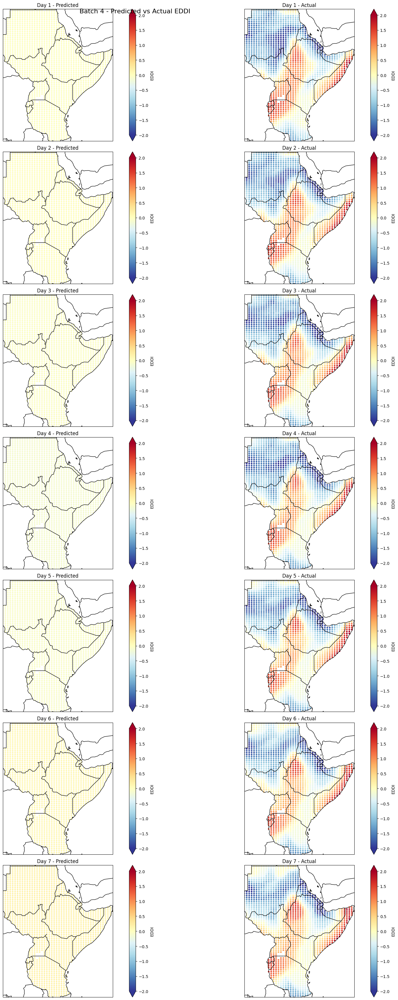

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import pandas as pd
from matplotlib.colors import TwoSlopeNorm
from IPython.display import display, clear_output

def visualize_predictions(predictions, metadata):
    # Extract predictions and actual values
    y_hat = predictions['y_hat'].squeeze().numpy()
    y = predictions['y'].squeeze().numpy()

    # Get latitude and longitude from metadata
    lats = metadata['lat'].values
    lons = metadata['lon'].values

    # Print debugging information
    print(f"y_hat shape: {y_hat.shape}")
    print(f"y shape: {y.shape}")
    print(f"Number of unique latitudes: {len(np.unique(lats))}")
    print(f"Number of unique longitudes: {len(np.unique(lons))}")

    # Color scheme
    cmap = plt.cm.RdYlBu_r
    norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

    for batch in range(y_hat.shape[0]):
        # Set up the plot for this batch
        fig, axes = plt.subplots(7, 2, figsize=(20, 35),
                                 subplot_kw={'projection': ccrs.PlateCarree()})

        for day in range(y_hat.shape[1]):
            ax_hat = axes[day, 0]
            ax_y = axes[day, 1]

            # Get the data for this day and batch
            z_hat = y_hat[batch, day, :]
            z_y = y[batch, day, :]

            # Plot y_hat
            scatter_hat = ax_hat.scatter(lons, lats, c=z_hat, cmap=cmap, norm=norm, transform=ccrs.PlateCarree(), s=10)
            ax_hat.add_feature(cfeature.COASTLINE)
            ax_hat.add_feature(cfeature.BORDERS)
            ax_hat.set_extent([lons.min(), lons.max(), lats.min(), lats.max()])
            plt.colorbar(scatter_hat, ax=ax_hat, label='EDDI', extend='both')
            ax_hat.set_title(f'Day {day+1} - Predicted')

            # Plot y
            scatter_y = ax_y.scatter(lons, lats, c=z_y, cmap=cmap, norm=norm, transform=ccrs.PlateCarree(), s=10)
            ax_y.add_feature(cfeature.COASTLINE)
            ax_y.add_feature(cfeature.BORDERS)
            ax_y.set_extent([lons.min(), lons.max(), lats.min(), lats.max()])
            plt.colorbar(scatter_y, ax=ax_y, label='EDDI', extend='both')
            ax_y.set_title(f'Day {day+1} - Actual')

        # Add a main title for the batch
        fig.suptitle(f'Batch {batch+1} - Predicted vs Actual EDDI', fontsize=16)

        # Adjust the layout
        plt.tight_layout()

        # Display in the notebook
        display(fig)
        plt.close(fig)

        # Clear the output to avoid cluttering the notebook
        clear_output(wait=True)

# Assuming you have the metadata DataFrame available
metadata = pd.read_parquet('/content/drive/MyDrive/data/metadata.parquet')

# Call the function for each item in predictions_test
for i, pred in enumerate(predictions_test):
    visualize_predictions(pred, metadata)
    print(f"Processed item {i+1}/{len(predictions_test)}")

In [ ]:
# predictions_val = trainer.predict(predictor, datamodule.val_dataloader())

In [ ]:
# predictions_val